In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.ensemble import VotingClassifier

from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint as sp_randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils import resample
from sklearn import metrics

from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings('ignore')

In [2]:
hike1 = pd.read_csv('train.csv')

In [3]:
hike2 = pd.read_csv('user_features.csv')

In [4]:
hike1.head()

,node1_id,node2_id,is_chat
0,8446602,6636127,0
1,1430102,7433949,0
2,2803017,8372333,0
3,4529348,894645,0
4,5096572,4211638,0


In [5]:
hike1.tail()

,node1_id,node2_id,is_chat
70661797,7517344,5899014,0
70661798,129076,4447103,0
70661799,2889780,4458525,0
70661800,338256,6972515,0
70661801,5818323,1098949,1


### Machine showing memory error for this many rows, so we will make use of 20000 instances to create a model. In which we will take 10k instance of 1 and 10k instance of 0 to get balanced model

In [6]:
hike1_1=hike1[hike1.is_chat == 1].head(5000)

In [7]:
hike1_0=hike1[hike1.is_chat ==0].head(5000)

In [8]:
hike1= pd.concat([hike1_1,hike1_0], axis=0)
hike1.shape

(10000, 3)

In [9]:
hike1.head()

,node1_id,node2_id,is_chat
7,7159649,7791327,1
19,4771042,998845,1
59,3079025,3410678,1
82,3651503,3656309,1
93,6434643,1107217,1


In [10]:
hike2.head()

,node_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,2,14,14,14,12,12,12,7,7,7,0,0,0,15
1,3,31,9,7,31,16,12,31,15,12,31,15,12,8
2,4,0,0,0,0,0,0,0,0,0,0,0,0,7
3,5,31,4,1,31,7,1,31,9,1,31,9,0,15
4,6,31,27,20,31,24,14,31,20,10,31,20,5,7


### One file contain the user_id for user1 and user2 from which we are saying that user1 contacted user2, the features of both the user is given in other file. First we will create a file containing feature of both users

In [11]:
hike2.columns = ['node1_id', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']

In [12]:
hike2.tail()

,node1_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
8264271,8874622,31,1,0,31,2,1,31,3,1,31,10,6,15
8264272,8874623,0,0,0,0,0,0,0,0,0,0,0,0,15
8264273,8874624,2,2,1,2,2,1,0,0,0,0,0,0,15
8264274,8874625,31,18,0,31,16,0,31,18,0,31,18,0,15
8264275,8874626,8,2,0,15,4,0,21,4,0,28,8,0,15


In [13]:
hike1.shape

(10000, 3)

In [14]:
hike2.shape

(8264276, 14)

In [15]:
hike = hike1.merge(hike2, on='node1_id')
hike.head()

,node1_id,node2_id,is_chat,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,7159649,7791327,1,0,0,0,2,2,0,8,7,2,15,13,6,10
1,4771042,998845,1,31,0,0,31,2,0,31,4,0,31,4,0,8
2,3079025,3410678,1,0,0,0,0,0,0,1,1,0,8,3,1,11
3,3651503,3656309,1,30,15,0,30,19,2,31,25,8,31,30,15,11
4,6434643,1107217,1,29,16,2,29,19,4,27,14,5,26,10,5,15


In [16]:
hike.shape

(10000, 16)

In [17]:
hike.head(10)

,node1_id,node2_id,is_chat,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,7159649,7791327,1,0,0,0,2,2,0,8,7,2,15,13,6,10
1,4771042,998845,1,31,0,0,31,2,0,31,4,0,31,4,0,8
2,3079025,3410678,1,0,0,0,0,0,0,1,1,0,8,3,1,11
3,3651503,3656309,1,30,15,0,30,19,2,31,25,8,31,30,15,11
4,6434643,1107217,1,29,16,2,29,19,4,27,14,5,26,10,5,15
5,4481921,504660,1,12,12,2,16,16,8,21,21,13,21,21,13,15
6,8531387,8136174,1,15,11,4,8,5,2,2,2,2,0,0,0,15
7,639430,4249041,1,31,31,31,31,31,31,31,31,31,31,31,31,7
8,2894527,5343816,1,31,5,0,31,6,0,31,8,0,31,10,0,15
9,2095286,7346,1,0,0,0,0,0,0,4,1,0,11,2,0,15


In [18]:
hike.columns = ['node1_id', 'node2_id', 'is_chat', 'f1_1', 'f2_1', 'f3_1', 'f4_1', 'f5_1', 'f6_1',
       'f7_1', 'f8_1', 'f9_1', 'f10_1', 'f11_1', 'f12_1', 'f13_1']

In [19]:
hike2.columns = ['node2_id', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']

In [20]:
hikedf = hike.merge(hike2, on='node2_id')

In [21]:
hikedf.head()

,node1_id,node2_id,is_chat,f1_1,f2_1,f3_1,f4_1,f5_1,f6_1,f7_1,...,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,7159649,7791327,1,0,0,0,2,2,0,8,...,31,25,12,31,27,18,31,29,24,11
1,4771042,998845,1,31,0,0,31,2,0,31,...,31,10,0,31,10,0,31,10,2,8
2,3079025,3410678,1,0,0,0,0,0,0,1,...,0,0,0,5,1,0,12,5,1,15
3,3651503,3656309,1,30,15,0,30,19,2,31,...,31,16,6,31,22,10,24,18,10,11
4,6434643,1107217,1,29,16,2,29,19,4,27,...,31,24,19,31,21,17,31,16,13,15


In [22]:
hikedf.columns

Index(['node1_id', 'node2_id', 'is_chat', 'f1_1', 'f2_1', 'f3_1', 'f4_1',
       'f5_1', 'f6_1', 'f7_1', 'f8_1', 'f9_1', 'f10_1', 'f11_1', 'f12_1',
       'f13_1', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13'],
      dtype='object')

### Now we will create one file containing the average of features of user1 and user2 but as the information is of user1 texting user2, I will give more weightage to user1 in this average. So  multiplying 3 to the feature of user1 and taking avg of user1 and user2

In [25]:
hikedf['f1'] = (hikedf['f1']+4*hikedf['f1_1'])/5
hikedf['f2'] = (hikedf['f2']+4*hikedf['f2_1'])/5
hikedf['f3'] = (hikedf['f3']+4*hikedf['f3_1'])/5
hikedf['f4'] = (hikedf['f4']+4*hikedf['f4_1'])/5
hikedf['f5'] = (hikedf['f5']+4*hikedf['f5_1'])/5
hikedf['f6'] = (hikedf['f6']+4*hikedf['f6_1'])/5
hikedf['f7'] = (hikedf['f7']+4*hikedf['f7_1'])/5
hikedf['f8'] = (hikedf['f8']+4*hikedf['f8_1'])/5
hikedf['f9'] = (hikedf['f9']+4*hikedf['f9_1'])/5
hikedf['f10'] = (hikedf['f10']+4*hikedf['f10_1'])/5
hikedf['f11'] = (hikedf['f11']+4*hikedf['f11_1'])/5
hikedf['f12'] = (hikedf['f12']+4*hikedf['f12_1'])/5
hikedf['f13'] = (hikedf['f13']+4*hikedf['f13_1'])/5

KeyError: 'f1_1'

In [26]:
hikedf.drop(['f1_1', 'f2_1', 'f3_1', 'f4_1',
       'f5_1', 'f6_1', 'f7_1', 'f8_1', 'f9_1', 'f10_1', 'f11_1', 'f12_1',
       'f13_1'], axis=1, inplace=True)

KeyError: "['f1_1' 'f2_1' 'f3_1' 'f4_1' 'f5_1' 'f6_1' 'f7_1' 'f8_1' 'f9_1' 'f10_1'\n 'f11_1' 'f12_1' 'f13_1'] not found in axis"

In [27]:
hikedf.head()

,node1_id,node2_id,is_chat,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,7159649,7791327,1,6.2,4.4,1.8,7.8,6.6,2.4,12.6,11.0,5.2,18.2,16.2,9.6,10.2
1,4771042,998845,1,31.0,1.8,0.0,31.0,3.6,0.0,31.0,5.2,0.0,31.0,5.2,0.4,8.0
2,3079025,3410678,1,0.0,0.0,0.0,0.0,0.0,0.0,1.8,1.0,0.0,8.8,3.4,1.0,11.8
3,3651503,3656309,1,30.2,14.4,1.0,30.2,18.4,2.8,31.0,24.4,8.4,29.6,27.6,14.0,11.0
4,6434643,1107217,1,29.4,18.4,5.8,29.4,20.0,7.0,27.8,15.4,7.4,27.0,11.2,6.6,15.0


## Exploratory Data Analytics

f1


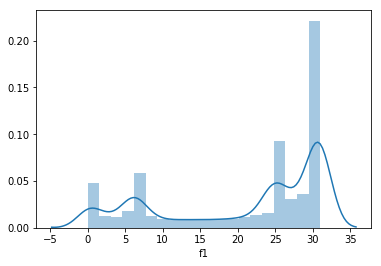

f2


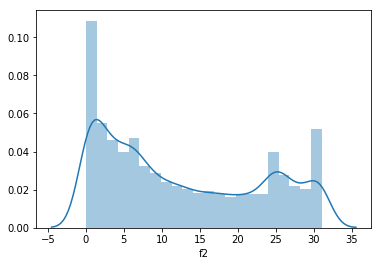

f3


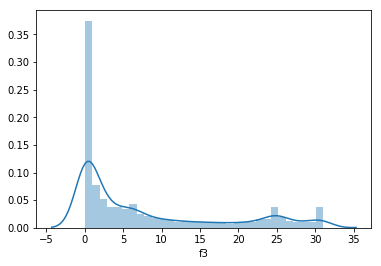

f4


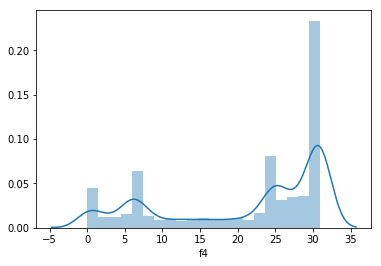

f5


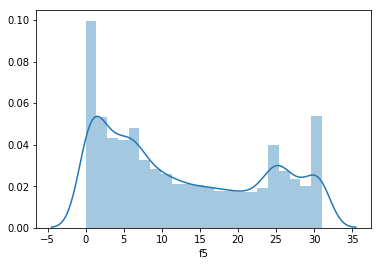

f6


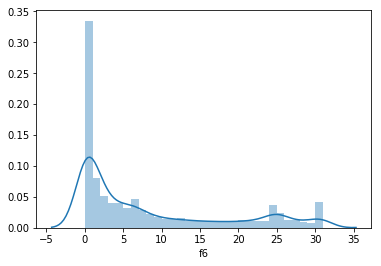

f7


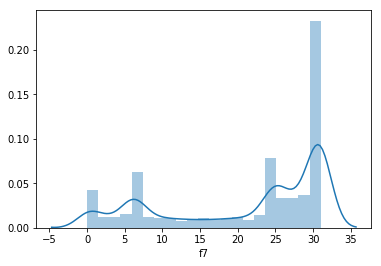

f8


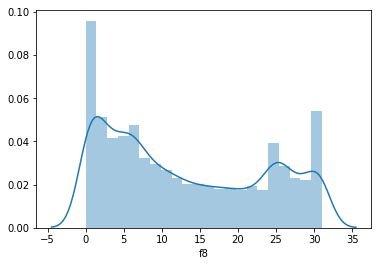

f9


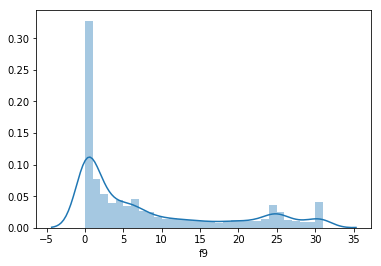

f10


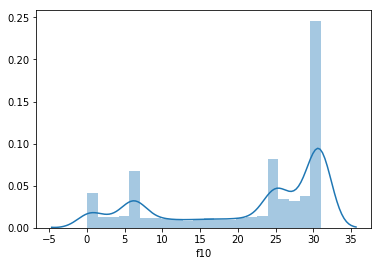

f11


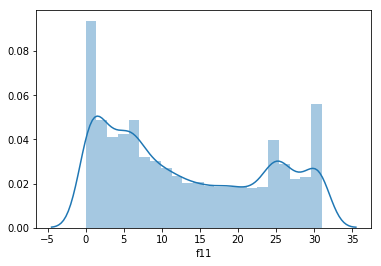

f12


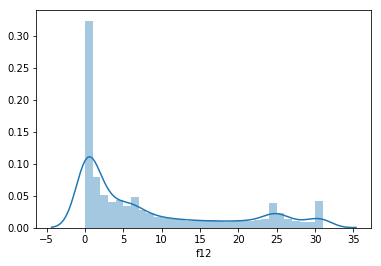

f13


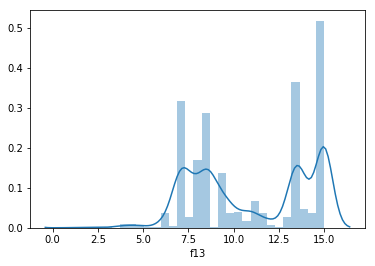

In [26]:
features = ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']

for i in features:
    print(i)
    sns.distplot(hikedf[i])
    plt.show()

f1


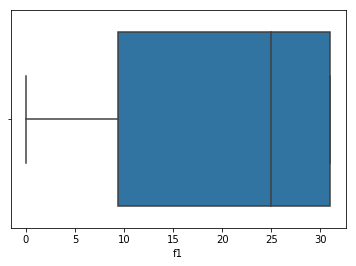

f2


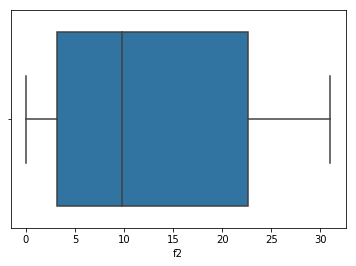

f3


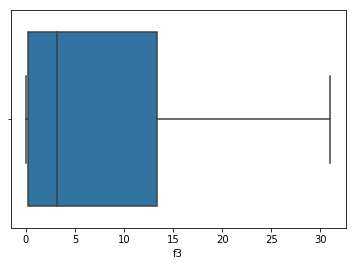

f4


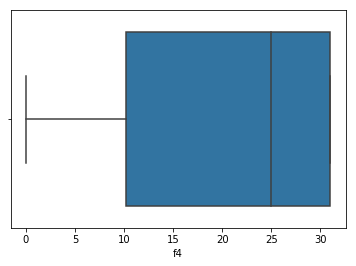

f5


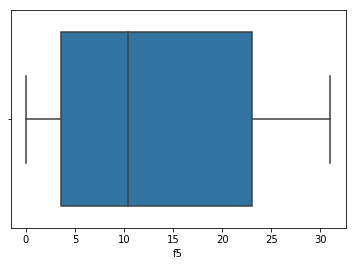

f6


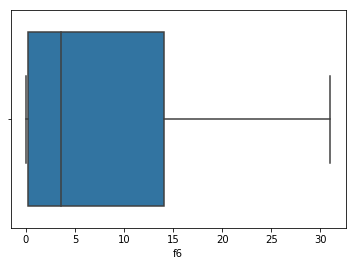

f7


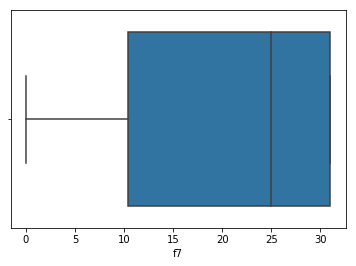

f8


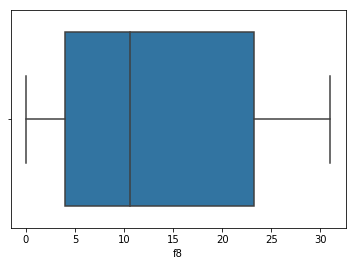

f9


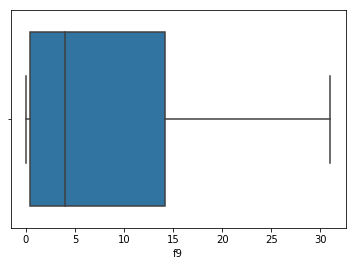

f10


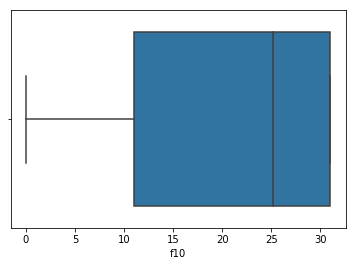

f11


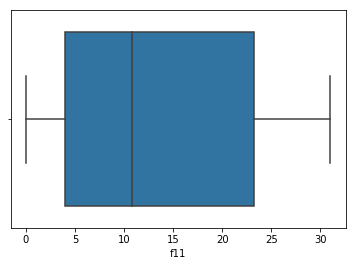

f12


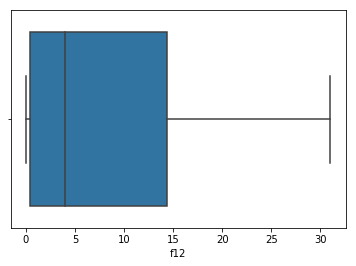

f13


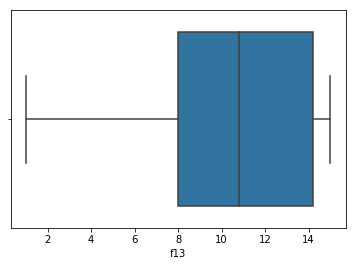

In [27]:
for i in features:
    print(i)
    sns.boxplot(hikedf[i])
    plt.show()

#### The outliers in above dataset are in bulk and as we can see in histogram the normal distribution is spreaded so we will consider all the datapoints for modelling

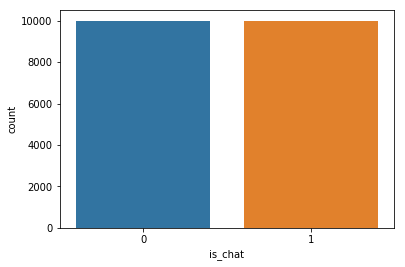

In [28]:
sns.countplot(hikedf.is_chat)
plt.show()

### The datapoints in sample is not equally distributed so we will use over-sampling technique to make the class balances

In [28]:
x= hikedf.drop(['node1_id', 'node2_id', 'is_chat'], axis=1)
y= hikedf.is_chat

In [29]:
x.columns

Index(['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11',
       'f12', 'f13'],
      dtype='object')

sm = SMOTE(k_neighbors=5,random_state=1)
x,y =sm.fit_sample(x,y)
x= pd.DataFrame(x, columns=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11',
       'f12', 'f13'])
y=pd.DataFrame(y, columns=['is_chat'])

hikeos = pd.concat([x,y],axis=1)
hikeos.shape

sns.countplot(hikeos.is_chat)
plt.show()

x=  f1 and y= f2


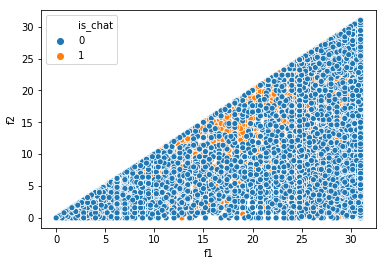

x=  f1 and y= f3


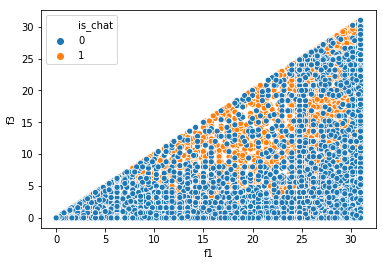

x=  f1 and y= f4


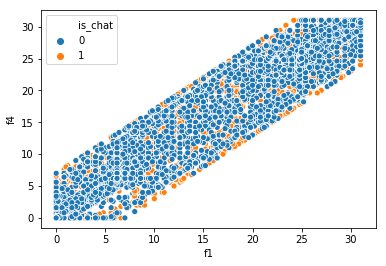

x=  f1 and y= f5


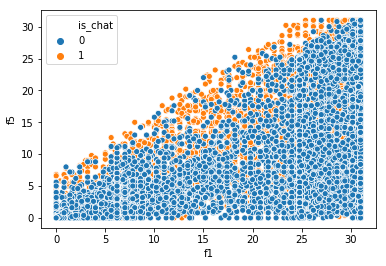

x=  f1 and y= f6


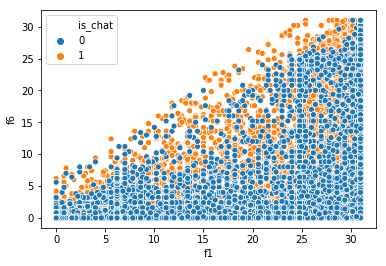

x=  f1 and y= f7


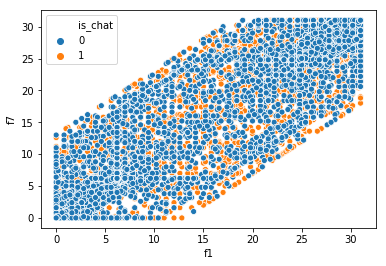

x=  f1 and y= f8


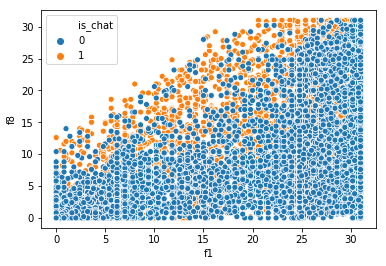

x=  f1 and y= f9


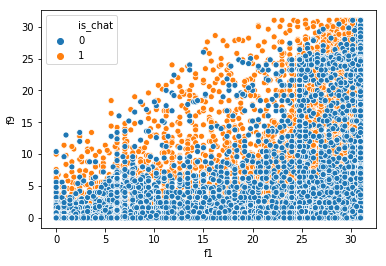

x=  f1 and y= f10


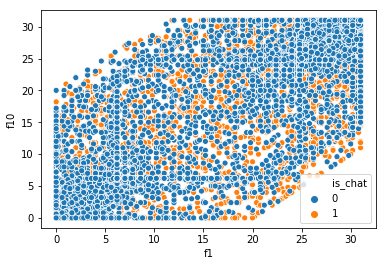

x=  f1 and y= f11


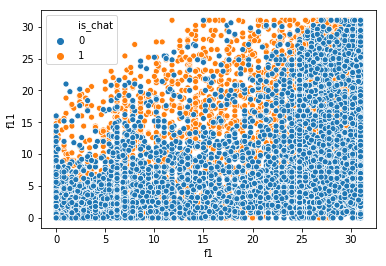

x=  f1 and y= f12


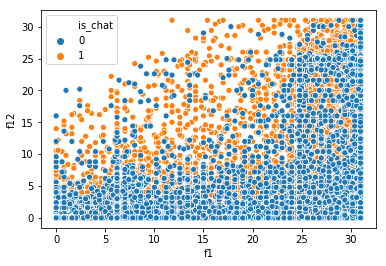

x=  f1 and y= f13


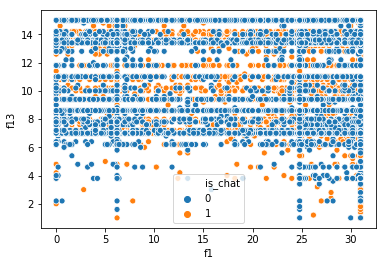

x=  f2 and y= f3


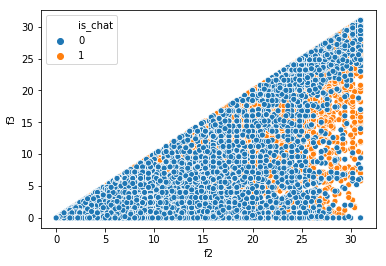

x=  f2 and y= f4


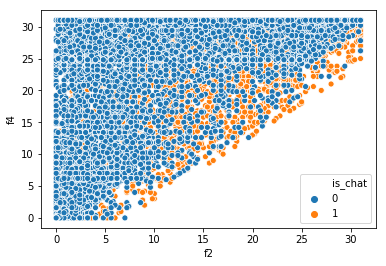

x=  f2 and y= f5


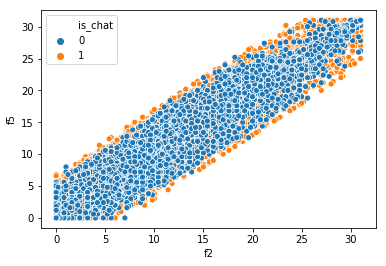

x=  f2 and y= f6


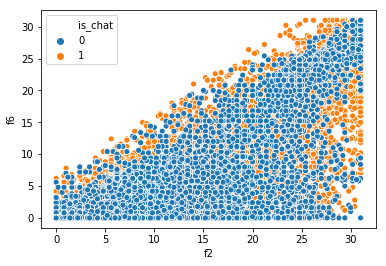

x=  f2 and y= f7


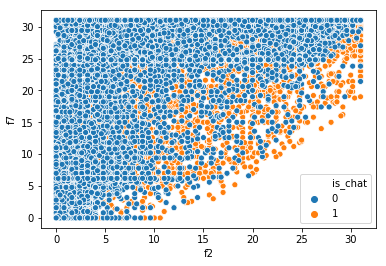

x=  f2 and y= f8


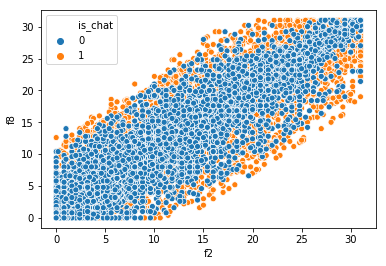

x=  f2 and y= f9


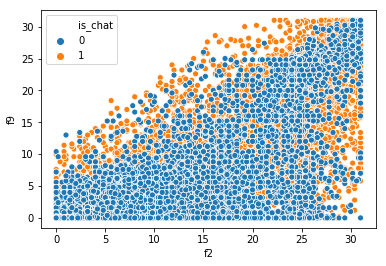

x=  f2 and y= f10


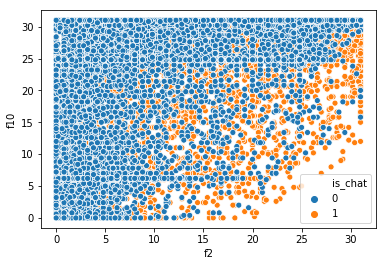

x=  f2 and y= f11


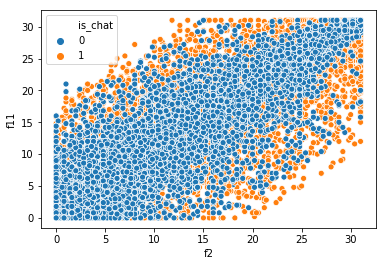

x=  f2 and y= f12


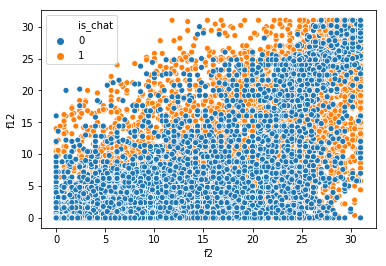

x=  f2 and y= f13


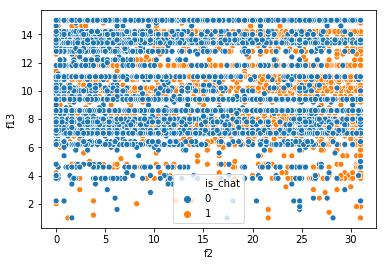

x=  f3 and y= f4


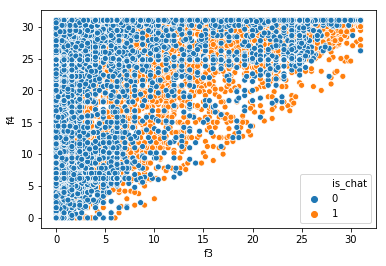

x=  f3 and y= f5


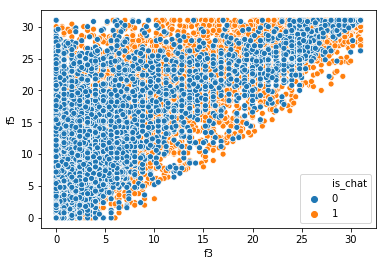

x=  f3 and y= f6


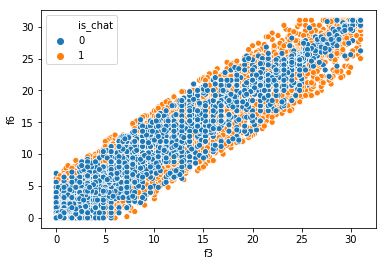

x=  f3 and y= f7


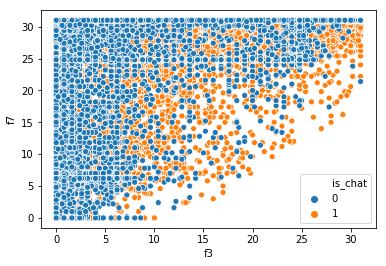

x=  f3 and y= f8


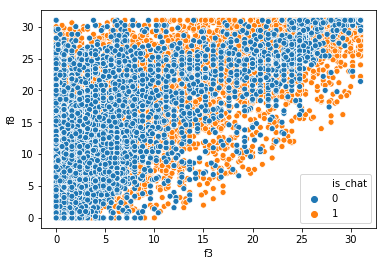

x=  f3 and y= f9


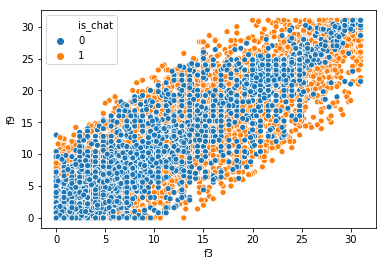

x=  f3 and y= f10


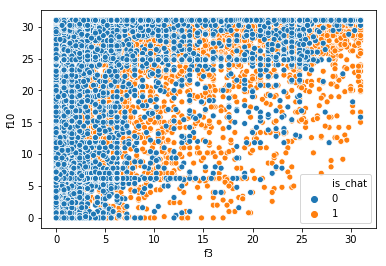

x=  f3 and y= f11


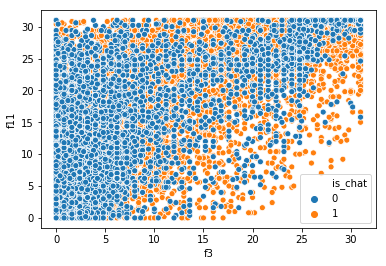

x=  f3 and y= f12


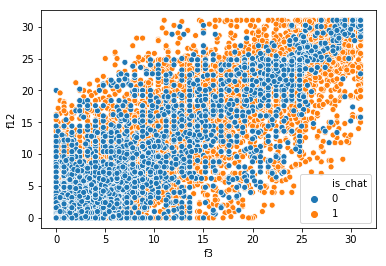

x=  f3 and y= f13


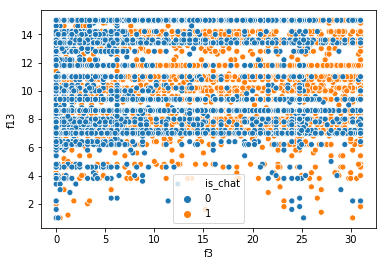

x=  f4 and y= f5


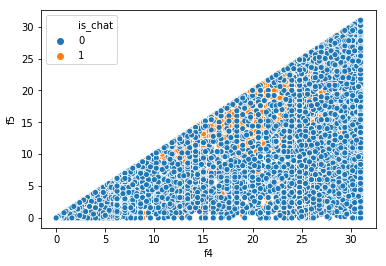

x=  f4 and y= f6


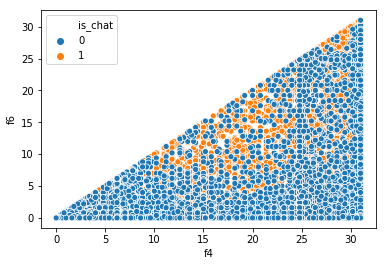

x=  f4 and y= f7


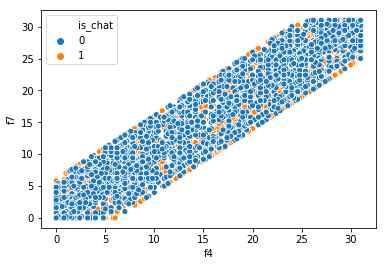

x=  f4 and y= f8


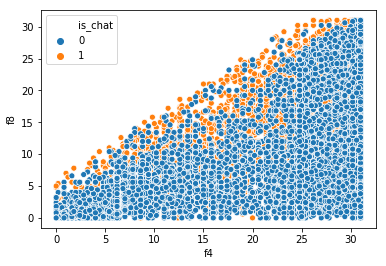

x=  f4 and y= f9


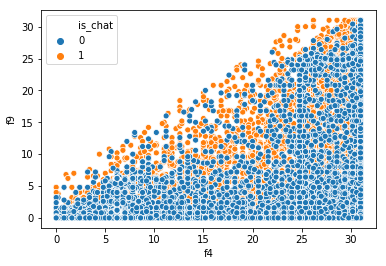

x=  f4 and y= f10


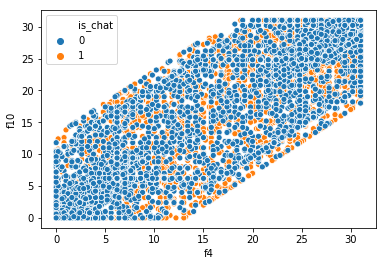

x=  f4 and y= f11


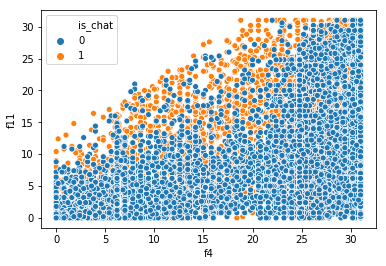

x=  f4 and y= f12


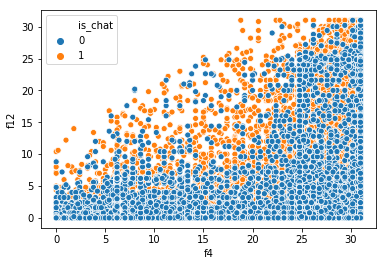

x=  f4 and y= f13


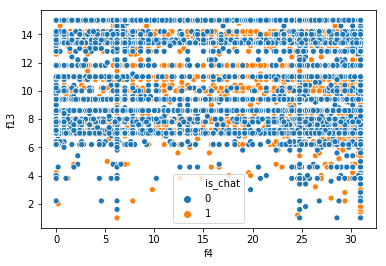

x=  f5 and y= f6


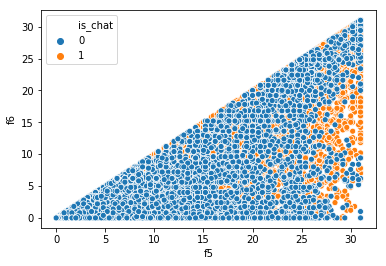

x=  f5 and y= f7


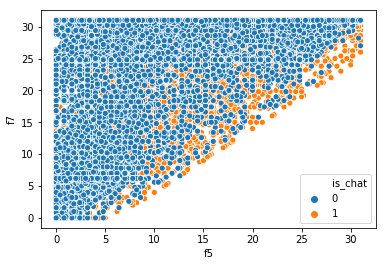

x=  f5 and y= f8


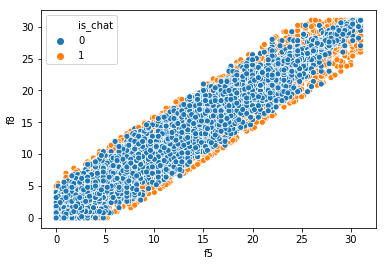

x=  f5 and y= f9


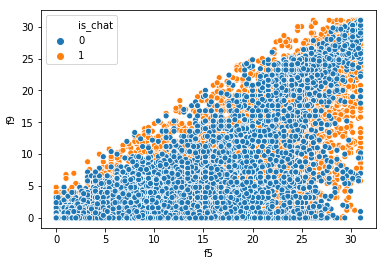

x=  f5 and y= f10


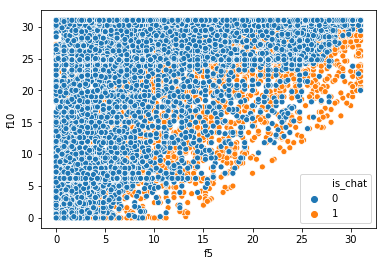

x=  f5 and y= f11


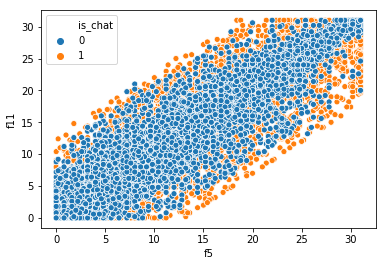

x=  f5 and y= f12


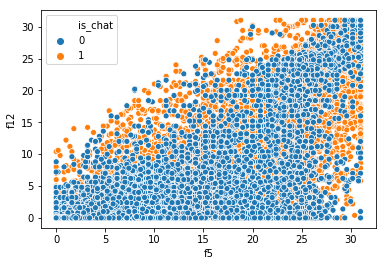

x=  f5 and y= f13


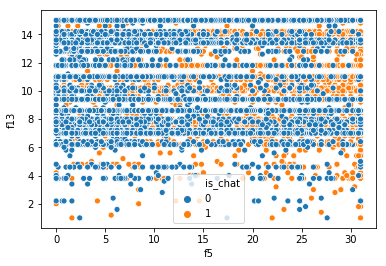

x=  f6 and y= f7


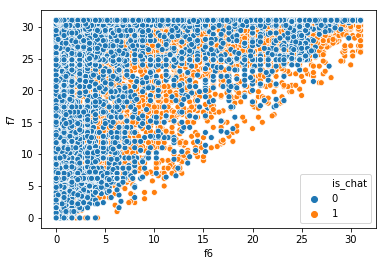

x=  f6 and y= f8


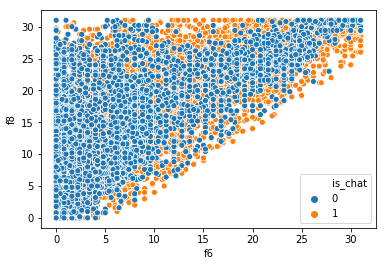

x=  f6 and y= f9


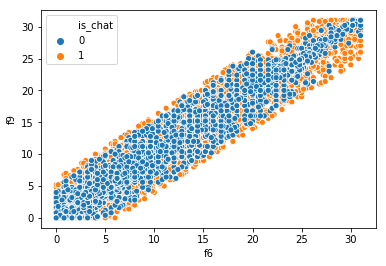

x=  f6 and y= f10


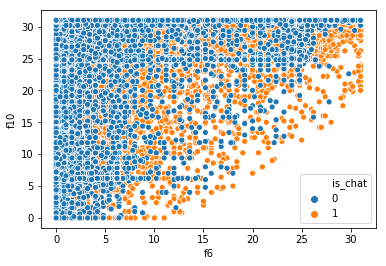

x=  f6 and y= f11


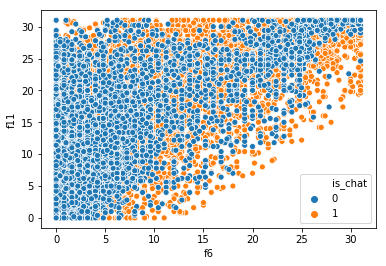

x=  f6 and y= f12


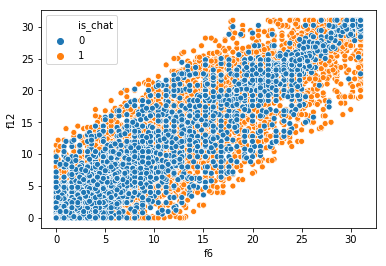

x=  f6 and y= f13


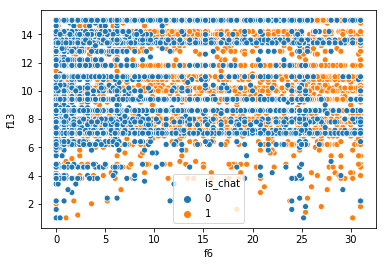

x=  f7 and y= f8


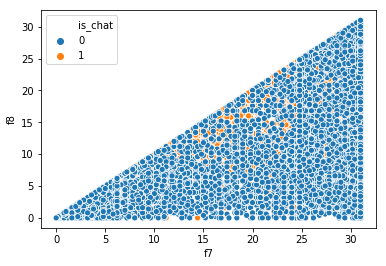

x=  f7 and y= f9


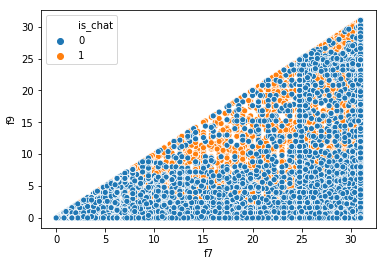

x=  f7 and y= f10


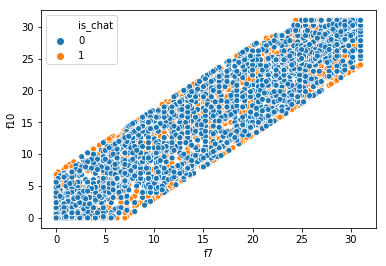

x=  f7 and y= f11


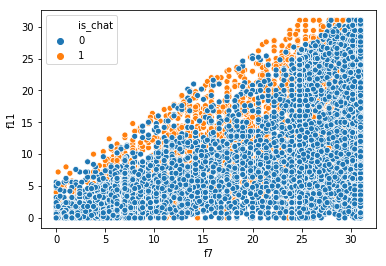

x=  f7 and y= f12


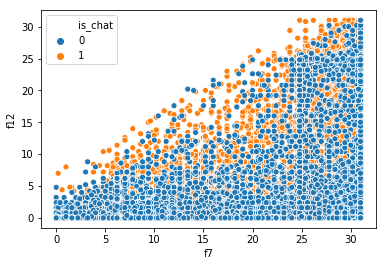

x=  f7 and y= f13


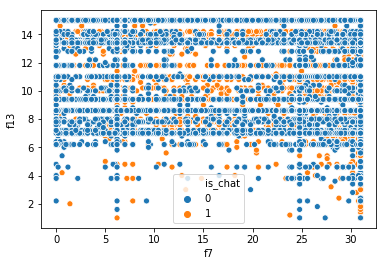

x=  f8 and y= f9


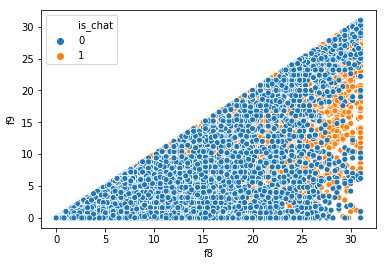

x=  f8 and y= f10


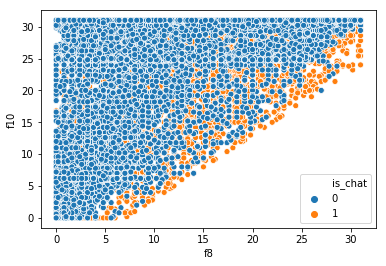

x=  f8 and y= f11


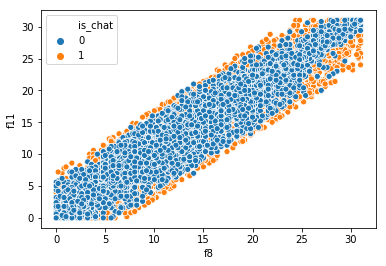

x=  f8 and y= f12


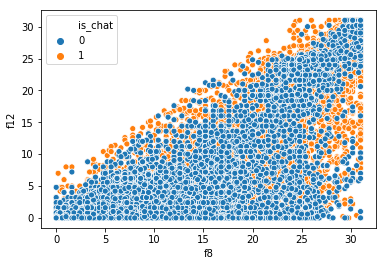

x=  f8 and y= f13


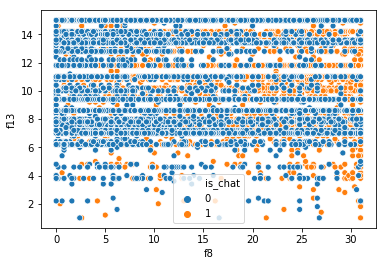

x=  f9 and y= f10


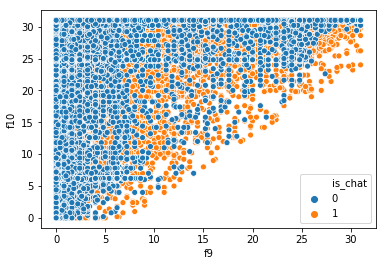

x=  f9 and y= f11


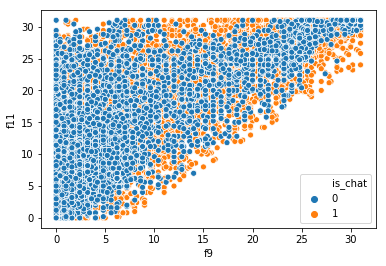

x=  f9 and y= f12


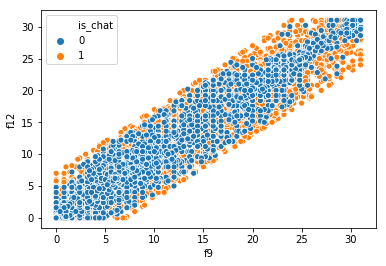

x=  f9 and y= f13


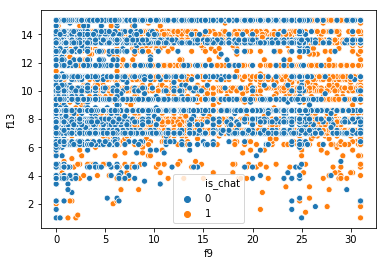

x=  f10 and y= f11


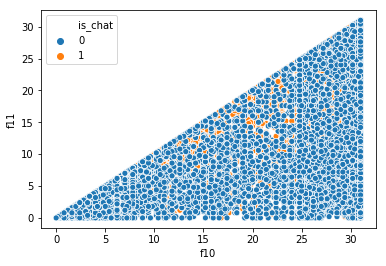

x=  f10 and y= f12


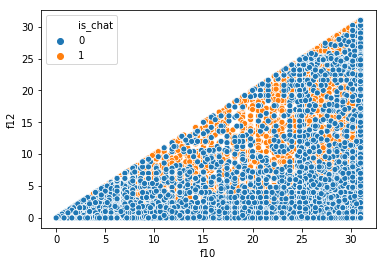

x=  f10 and y= f13


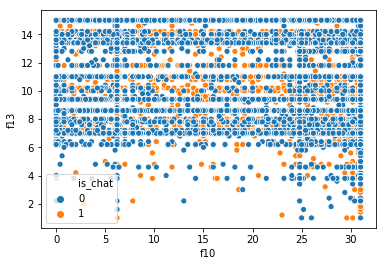

x=  f11 and y= f12


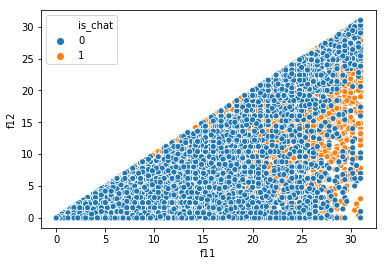

x=  f11 and y= f13


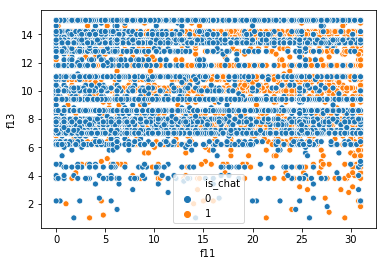

x=  f12 and y= f13


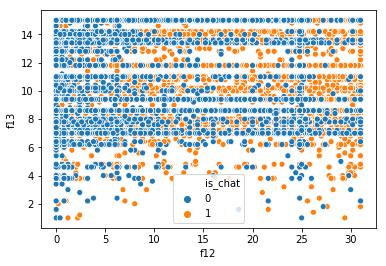

In [31]:
features = ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']
for i in features:
    features = [x for x in features if x!= i]
    for j in features:
        print('x= ', i,'and y=', j)
        sns.scatterplot(x=i, y=j, hue='is_chat', data=hikedf)
        plt.show()

In [32]:
list1= [1,2,3,4,5,6]

list1 = [x for x in list1 if x!= 1]
list1

[2, 3, 4, 5, 6]

# Modelling

### Train-Val-Test Split

In [30]:
#x= hikeos.drop('is_chat', axis=1)
#y= hikeos.is_chat
sc = StandardScaler()
x_std = sc.fit_transform(x)

In [31]:
x_split, x_test, y_split, y_test = train_test_split(x,y,test_size=0.2, random_state=100) 
x_train, x_val, y_train, y_val = train_test_split(x_split,y_split,test_size=0.2, random_state=100)

x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)
x_val_std = sc.transform(x_val)

### 1. Logistic Regression

In [32]:
logreg = LogisticRegression()
logreg.fit(x_train,y_train)
print('The accuracy score for Logistic Regression model is %1.2f per cent' %((logreg.score(x_test,y_test))*100))

The accuracy score for Logistic Regression model is 68.60 per cent


### 2. KNN Classifier

In [33]:
knncl = KNeighborsClassifier()
param= {'n_neighbors': range(1,30)}
knngrid = GridSearchCV(knncl, param_grid= param, cv=5)
knngrid.fit(x_val_std,y_val) #for distance based model we use standardize values
knngrid.best_params_

{'n_neighbors': 23}

In [34]:
knncl = KNeighborsClassifier(n_neighbors=29)
knncl.fit(x_train_std,y_train)
print('The accuracy score for KNN Classifier model is %1.2f per cent' %((knncl.score(x_test_std,y_test))*100))

The accuracy score for KNN Classifier model is 71.00 per cent


### 3. Decision Tree

In [35]:
dtcl = DecisionTreeClassifier()
params= {'max_depth': np.arange(1,30)}
dtgrid= GridSearchCV(dtcl,params,cv=5)
dtgrid.fit(x_val,y_val)
dtgrid.best_params_

{'max_depth': 4}

In [36]:
dtcl = DecisionTreeClassifier(max_depth=3)
dtcl.fit(x_train, y_train)
print('The accuracy score for Decision Tree model is %1.2f per cent' %((dtcl.score(x_test,y_test)*100)))

The accuracy score for Decision Tree model is 69.80 per cent


### 4. Naive Bayes Model

In [37]:
gnbcl = GaussianNB()
gnbcl.fit(x_train, y_train)
print('The accuracy score for Gaussian Naive Bayes model is %1.2f per cent' %((gnbcl.score(x_test,y_test)*100)))

The accuracy score for Gaussian Naive Bayes model is 67.35 per cent


### 5. Multinomial Naive Bayes

In [38]:
mncl = MultinomialNB()
mncl.fit(x_train, y_train)
print('The accuracy score for Multinominal Naive Bayes model is %1.2f per cent' %((mncl.score(x_test,y_test)*100)))

The accuracy score for Multinominal Naive Bayes model is 68.75 per cent


### 6. Random Forest

In [39]:
rfcl = RandomForestClassifier()
param = {'n_estimators': sp_randint(1, 80)}
randomCV = RandomizedSearchCV(rfcl, param_distributions=param, n_iter=80)
randomCV.fit(x_val,y_val)
randomCV.best_params_

{'n_estimators': 33}

In [40]:
rfcl = RandomForestClassifier(n_estimators=78)
rfcl.fit(x_train, y_train)
print('The accuracy score for Random Forest model is %1.2f per cent' %((rfcl.score(x_test,y_test)*100)))

The accuracy score for Random Forest model is 70.10 per cent


### 7. Bagging Classifier

In [41]:
bgcl = BaggingClassifier()
param = {'n_estimators': sp_randint(1, 80)}
randomCV = RandomizedSearchCV(bgcl, param_distributions=param, n_iter=80)
randomCV.fit(x_val,y_val)
randomCV.best_params_

{'n_estimators': 59}

In [42]:
bgcl = BaggingClassifier(n_estimators=68)
bgcl.fit(x_train, y_train)
print('The accuracy score for Bagging Classifier model is %1.2f per cent' %((bgcl.score(x_test,y_test)*100)))

The accuracy score for Bagging Classifier model is 69.85 per cent


### 8. Adaptive Boosting

In [43]:
abcl = AdaBoostClassifier()
param = {'n_estimators': sp_randint(1, 80)}
randomCV = RandomizedSearchCV(abcl, param_distributions=param, n_iter=80)
randomCV.fit(x_val,y_val)
randomCV.best_params_

{'n_estimators': 55}

In [44]:
abcl = AdaBoostClassifier(n_estimators=62)
abcl.fit(x_train, y_train)
print('The accuracy score for Adaptive Boosting model is %1.2f per cent' %((abcl.score(x_test,y_test)*100)))

The accuracy score for Adaptive Boosting model is 71.65 per cent


### 9. Gradient Boosting

In [45]:
gbcl = GradientBoostingClassifier()
param = {'n_estimators': sp_randint(1, 80)}
randomCV = RandomizedSearchCV(gbcl, param_distributions=param, n_iter=80)
randomCV.fit(x_val,y_val)
randomCV.best_params_

{'n_estimators': 35}

In [46]:
gbcl = GradientBoostingClassifier(n_estimators = 61)
gbcl.fit(x_train,y_train)
print('The accuracy score for Gradient Boosting model is %1.2f per cent' %((gbcl.score(x_test,y_test)*100)))

The accuracy score for Gradient Boosting model is 71.90 per cent


### 10. XG Boost

In [47]:
xgcl = xgb.XGBClassifier()
param = {'n_estimators': sp_randint(1, 80)}
randomCV = RandomizedSearchCV(xgcl, param_distributions=param, n_iter=80)
randomCV.fit(x_val,y_val)
randomCV.best_params_

{'n_estimators': 56}

In [50]:
xgcl = xgb.XGBClassifier(n_estimators=56)
xgcl.fit(x_train, y_train)
print('The accuracy score for XG Boost model is %1.2f per cent' %((xgcl.score(x_test,y_test)*100)))

The accuracy score for XG Boost model is 72.20 per cent


### 11. Voting Classifier

In [49]:
vocl = VotingClassifier(estimators = [('RandomForest', rfcl),('Bagging Classifier', bgcl),('Gradient Boosting',gbcl)]
                       , voting='soft')
vocl.fit(x_train,y_train)
print('The accuracy of voting model is : %1.4f' %vocl.score(x_test,y_test))

The accuracy of voting model is : 0.7165


0.8007922644681533


(-0.05, 1.05)

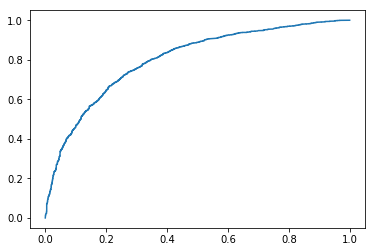

In [54]:
y_pred = vocl.predict_proba(x_test)

fpr,tpr,thr = metrics.roc_curve(y_test,y_pred[:,1])
roc_auc = metrics.auc(fpr,tpr)

print(roc_auc)

plt.figure()
plt.plot(fpr,tpr)
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])

## K-Fold Analysis

In [56]:
models=[]
models.append(('Logistic Regression', logreg))
models.append(('Naive Bayes     ', gnbcl))
models.append(('Mutinominal NB   ', mncl))
models.append(('KNeighbour      ',knncl))
models.append(('Decision Tree     ',dtcl))
models.append(('Random Forest   ', rfcl))
models.append(('Bagging Classifier', bgcl))
models.append(('Ada Boosting     ',abcl))
models.append(('Gradient Boosting',gbcl))
models.append(('XG Boost Classifier',xgcl))
models.append(('Voting Classifier ',vocl))

In [57]:
results= []
names= []

for name,model in models:
    kfold= model_selection.KFold(n_splits = 10, random_state=2, shuffle=True)
    cv_results = model_selection.cross_val_score(model, x, y, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = "%s:\t %f (%f)" %(name,cv_results.mean(),cv_results.std())
    print(msg)

Logistic Regression:	 0.678000 (0.008476)
Naive Bayes     :	 0.665900 (0.009672)
Mutinominal NB   :	 0.680450 (0.009986)
KNeighbour      :	 0.706300 (0.007969)
Decision Tree     :	 0.704050 (0.009438)
Random Forest   :	 0.711900 (0.012538)
Bagging Classifier:	 0.710500 (0.011459)
Ada Boosting     :	 0.724800 (0.010565)
Gradient Boosting:	 0.730350 (0.012048)
XG Boost Classifier:	 0.730450 (0.010231)
Voting Classifier :	 0.724750 (0.011274)


## Confidence Interval for Top Models

temp = pd.concat([x,y],axis=1) #So that the taget variable will be at the last column
values= temp.values

iterations = 50
n_size = int(len(values)*0.7)

rfstats = []
bgstats = []
vostats = []

for i in range(iterations):
    train = resample(values,n_samples=n_size)
    test = np.array([x for x in values if x.tolist() not in train.tolist()])
    
    rfcl.fit(train[:,:-1] ,train[:,-1])
    rfscore = rfcl.score(test[:,:-1],test[:,-1])
    rfstats.append(rfscore)
    
    bgcl.fit(train[:,:-1] ,train[:,-1])
    bgscore = bgcl.score(test[:,:-1],test[:,-1])
    bgstats.append(bgscore)
    
    vocl.fit(train[:,:-1] ,train[:,-1])
    voscore = vocl.score(test[:,:-1],test[:,-1])
    vostats.append(voscore)

### Random Forest

sns.distplot(rfstats)
plt.title('Random Forest Algorithm')
plt.show()

confidence = 95
lower = (100-confidence)/2
upper = confidence + lower

print('The ',confidence, '% confidence interval is: ',round(np.percentile(rfstats,lower),4)*100,
      '% to ',round(np.percentile(rfstats,upper),4)*100,'%')

### Bagging Classifier

sns.distplot(bgstats)
plt.title('Bagging Classifier Algorithm')
plt.show()

confidence = 95
lower = (100-confidence)/2
upper = confidence + lower

print('The ',confidence, '% confidence interval is: ',round(np.percentile(bgstats,lower),4)*100,
      '% to ',round(np.percentile(bgstats,upper),4)*100,'%')

### Voting Classifier

sns.distplot(vostats)
plt.title('Voting Classifier Algorithm')
plt.show()

confidence = 95
lower = (100-confidence)/2
upper = confidence + lower

print('The ',confidence, '% confidence interval is: ',round(np.percentile(vostats,lower),4)*100,
      '% to ',round(np.percentile(vostats,upper),4)*100,'%')

## Forecast for the test file

In [51]:
test = pd.read_csv('test.csv')

In [52]:
test.shape

(11776968, 3)

In [53]:
hike2.columns = ['node1_id', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']
test1 = test.merge(hike2, on='node1_id')

test1.columns = ['id','node1_id', 'node2_id', 'f1_1', 'f2_1', 'f3_1', 'f4_1', 'f5_1', 'f6_1',
       'f7_1', 'f8_1', 'f9_1', 'f10_1', 'f11_1', 'f12_1', 'f13_1']

hike2.columns = ['node2_id', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13']

testdf = test1.merge(hike2, on='node2_id')

In [54]:
testdf.head()

,id,node1_id,node2_id,f1_1,f2_1,f3_1,f4_1,f5_1,f6_1,f7_1,...,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,1,7107094,8010772,31,6,1,31,6,1,31,...,31,24,3,31,25,3,31,26,4,15
1,6056943,1881351,8010772,0,0,0,0,0,0,0,...,31,24,3,31,25,3,31,26,4,15
2,3434399,1242529,8010772,31,19,0,31,18,0,31,...,31,24,3,31,25,3,31,26,4,15
3,3699049,4126495,8010772,31,30,0,31,30,2,31,...,31,24,3,31,25,3,31,26,4,15
4,4448588,647911,8010772,20,0,0,27,0,0,31,...,31,24,3,31,25,3,31,26,4,15


In [55]:
testdf['f1'] = (testdf['f1']+4*testdf['f1_1'])/5
testdf['f2'] = (testdf['f2']+4*testdf['f2_1'])/5
testdf['f3'] = (testdf['f3']+4*testdf['f3_1'])/5
testdf['f4'] = (testdf['f4']+4*testdf['f4_1'])/5
testdf['f5'] = (testdf['f5']+4*testdf['f5_1'])/5
testdf['f6'] = (testdf['f6']+4*testdf['f6_1'])/5
testdf['f7'] = (testdf['f7']+4*testdf['f7_1'])/5
testdf['f8'] = (testdf['f8']+4*testdf['f8_1'])/5
testdf['f9'] = (testdf['f9']+4*testdf['f9_1'])/5
testdf['f10'] = (testdf['f10']+4*testdf['f10_1'])/5
testdf['f11'] = (testdf['f11']+4*testdf['f11_1'])/5
testdf['f12'] = (testdf['f12']+4*testdf['f12_1'])/5
testdf['f13'] = (testdf['f13']+4*testdf['f13_1'])/5

In [56]:
testdf.drop(['f1_1', 'f2_1', 'f3_1', 'f4_1',
       'f5_1', 'f6_1', 'f7_1', 'f8_1', 'f9_1', 'f10_1', 'f11_1', 'f12_1',
       'f13_1'], axis=1, inplace=True)

In [57]:
testdf.head()

,id,node1_id,node2_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13
0,1,7107094,8010772,31.0,9.6,1.2,31.0,9.6,1.4,31.0,11.4,1.4,31.0,12.4,1.6,15.0
1,6056943,1881351,8010772,6.2,4.8,0.4,6.2,4.8,0.6,6.2,5.0,0.6,6.2,5.2,0.8,15.0
2,3434399,1242529,8010772,31.0,20.0,0.4,31.0,19.2,0.6,31.0,20.2,0.6,31.0,18.8,1.6,15.0
3,3699049,4126495,8010772,31.0,28.8,0.4,31.0,28.8,2.2,31.0,29.0,2.2,31.0,30.0,2.4,8.6
4,4448588,647911,8010772,22.2,4.8,0.4,27.8,4.8,0.6,31.0,5.0,0.6,31.0,5.2,0.8,15.0


In [ ]:
idn = testdf.id
test = testdf.drop(['id','node1_id','node2_id'], axis=1)

In [61]:
pred = vocl.predict_proba(test)

In [62]:
pred[:,1]

array([0.11904002, 0.0815991 , 0.10706911, ..., 0.16452993, 0.05630581,
       0.03927594])

In [63]:
output = pd.DataFrame({'id': idn, 'is_chat': pred[:,1]})
output.head()

,id,is_chat
0,1,0.119040
1,6056943,0.081599
2,3434399,0.107069
3,3699049,0.107972
4,4448588,0.082515


In [64]:
output.sort_values('id',inplace=True)
output.head(10)

,id,is_chat
0,1,0.119040
10,2,0.026487
58,3,0.139752
119,4,0.107188
182,5,0.039395
232,6,0.101108
348,7,0.048153
367,8,0.064142
410,9,0.057419
420,10,0.092764


In [65]:
output.to_csv('voting_classifier_20k_alter.csv', index=False)

In [66]:
output.shape

(11776968, 2)

In [67]:
pred = rfcl.predict_proba(test)
output = pd.DataFrame({'id': idn, 'is_chat': pred[:,1]})
output.sort_values('id',inplace=True)
output.to_csv('Random_forest_20k_alter.csv', index=False)

In [ ]:
pred = xgcl.predict_proba(test)
output = pd.DataFrame({'id': idn, 'is_chat': pred[:,1]})
output.sort_values('id',inplace=True)
output.to_csv('XG_Boost_Balanced.csv', index=False)

In [ ]:
pred = gbcl.predict_proba(test)
output = pd.DataFrame({'id': idn, 'is_chat': pred[:,1]})
output.sort_values('id',inplace=True)
output.to_csv('Gradient_Boost_Balanced.csv', index=False)

In [68]:
pred = bgcl.predict_proba(test)
output = pd.DataFrame({'id': idn, 'is_chat': pred[:,1]})
output.sort_values('id',inplace=True)
output.to_csv('Bagging_classifier_20k_alter.csv', index=False)

The End